In [1]:
import xarray as xr
import numpy as np
from matplotlib import gridspec
import matplotlib.pyplot as plt

import cartopy.crs as ccrs

import plotting
import importlib
importlib.reload(plotting)
from plotting import global_hatched_map, common_colorbar, custom_colormap, add_panel_labels

import helper
importlib.reload(helper)
from helper import *

from deepmip_dict import deepmip_dict

data_dir = '/Users/wb19586/Documents/coding_github/aprp_deepmip/aprp_output_data/'
cmip_dir = '/Users/wb19586/Documents/coding_github/aprp_deepmip/data/cmip6/'
deepmip_dir = '/Volumes/WD_Elements/DeepMIP_database/ceda/deepmip-eocene-p1/'
figure_dir = '/Users/wb19586/Documents/coding_github/aprp_deepmip/figures/'

In [2]:
ensembles = {}
ensembles_SI = {}

for model, details in deepmip_dict.items():
    # num_experiments = details['ncase'] + details['nsens']
    num_experiments = details['ncase']
    for i in range(num_experiments):
        contr = details['contr'][i]
        sensi = details['sensi'][i]

        # Define the conditions for ensemble averaging
        if ((contr == 'deepmip-eocene-p1-PI' and sensi == 'deepmip-eocene-p1-x1') or
            (contr == 'deepmip-eocene-p1-x1' and sensi == 'deepmip-eocene-p1-x3')):

            # Build file path
            aprp_file = f'{model}.{contr}.to.{sensi}.aprp.r180x90.nc'
            aprp_path = f'{data_dir}/deepmip/remapped/{aprp_file}'

            # Load dataset
            aprp_data_mm = xr.open_dataset(aprp_path, decode_times=False)
            aprp_data_mm = aprp_data_mm.where(aprp_data_mm <= 1e6, np.nan)  # Filter out bad values
            aprp_data    = aprp_data_mm.mean('time')

            # add net total variable
            aprp_data['net'] = aprp_data['alf'] + aprp_data['cld'] + aprp_data['clr']
            # combine cloud absorption and scattering
            aprp_data['cld_od'] = aprp_data['cld_ga'] + aprp_data['cld_mu']


            # Calculate GMST change for normalised feedback strengths
            coslat     = np.cos(np.deg2rad(aprp_data.lat))
            
            gmst1     = aprp_data['tas1'].weighted(coslat).mean(('lat','lon')) - 273.15
            gmst2     = aprp_data['tas2'].weighted(coslat).mean(('lat','lon')) - 273.15
            dT        = (gmst2 - gmst1).values

            # Normalize all fields by dT
            normalized_data = aprp_data / dT
            # normalized_data = aprp_data
            normalized_data['tas1'] *= dT
            normalized_data['tas2'] *= dT

            # Add to ensemble list
            key = f"{contr} to {sensi}"
            if key not in ensembles:
                ensembles[key] = {'datasets': [], 'models': [], 'sign_agreement': []}

            # Store dataset and model
            # ensembles[key]['datasets'].append(aprp_data)
            ensembles[key]['datasets'].append(normalized_data)
            ensembles[key]['models'].append(model)

            # Store sign of dataset
            ensembles[key]['sign_agreement'].append(np.sign(aprp_data))
            

# Calculate ensemble means and prepare model lists
ensemble_means = {}
ensemble_models = {}
ensemble_agreement = {}

for key, info in ensembles.items():
    ensemble_means[key] = xr.concat(info['datasets'], dim='model').mean(dim='model')
    ensemble_models[key] = info['models']

    # Create a DataArray from the list of signs and check for agreement
    sign_data = xr.concat(info['sign_agreement'], dim='model')
    ensemble_agreement[key] = ((sign_data > 0).all(dim='model') | (sign_data < 0).all(dim='model'))
    
# Print model lists for each ensemble
for key, models in ensemble_models.items():
    print(f"Models contributing to {key}: {', '.join(models)}")

Models contributing to deepmip-eocene-p1-PI to deepmip-eocene-p1-x1: CESM1.2-CAM5, COSMOS-landveg-r2413, GFDL-CM2.1, HadCM3B-M2.1aN, MIROC4m
Models contributing to deepmip-eocene-p1-x1 to deepmip-eocene-p1-x3: CESM1.2-CAM5, COSMOS-landveg-r2413, GFDL-CM2.1, HadCM3B-M2.1aN, MIROC4m


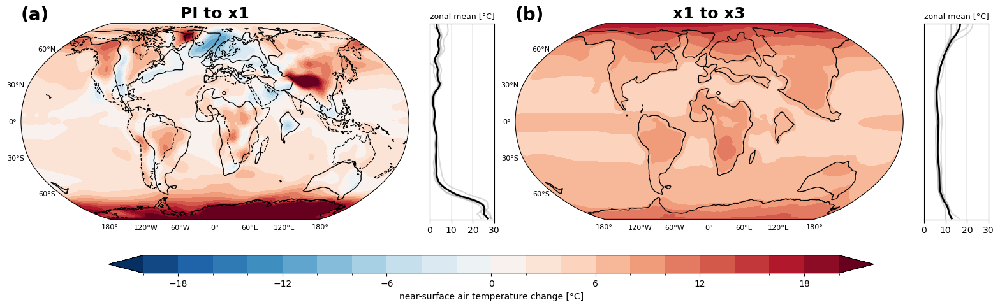

In [151]:
# plot ensemble mean maps of temperature change

# Preparing plots with consistent color scale and projection
variables = ['tas1', 'tas2']  # variables to plot
exp_labels = ['PI to x1', 'x1 to x3']

# fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(16, 6), 
#                         subplot_kw={'projection': ccrs.Robinson(central_longitude=0)} if i % 2 == 0 else None)

# Creating the figure and gridspec
fig = plt.figure(figsize=(20, 4.))  # Increase the width to allow more room for the zonal mean plots
gs_main = gridspec.GridSpec(1, 4, width_ratios=[1, 0.15, 1, 0.15],wspace=0.0)

# Custom levels for the colorbar
levels = np.arange(-20,22,2)

# Create a custom colormap with white around zero
custom_cmap =  custom_colormap('RdBu_r')
# load Herold land-sea mask
f_lsm_eocene = xr.open_dataset("/Users/wb19586/Documents/coding_github/aprp_deepmip/data/herold_etal_eocene_topo_1x1.halo.nc")

panel_headings = ["(a)", "(b)"]
for col, key in enumerate(sorted(ensemble_means.keys())):
    ax_map = fig.add_subplot(gs_main[col*2], projection=ccrs.Robinson(central_longitude=0))
    ax_zonal = fig.add_subplot(gs_main[col*2 + 1])
    
    tas1 = ensemble_means[key]['tas1']
    tas2 = ensemble_means[key]['tas2']
    diff = tas2 - tas1
    
    # Plot filled contours on the map
    im = global_hatched_map(ax_map, diff, None, f_lsm_eocene.topo, 'modern' if col == 0 else 'eocene', levels=levels, cmap='RdBu_r', title=f'{exp_labels[col]}', fontsize=18)
    
    # Plot zonal mean temperature change
    ax_zonal.set_xlim(0, 30)
    ax_zonal.set_ylim(-90, 90)
    ax_zonal.set_title('zonal mean [°C]', size=9)
    ax_zonal.axvline(0, color='black', linewidth=0.5)
    ax_zonal.tick_params(axis='y', labelleft=False, left=False)

    # plot individual models
    tas1_ind = xr.concat(ensembles[key]['datasets'], dim='model')['tas1']
    tas2_ind = xr.concat(ensembles[key]['datasets'], dim='model')['tas2']
    diff_ind = tas2_ind - tas1_ind
    for i in range(len(diff_ind.model)):
        ax_zonal.plot(diff_ind.isel(model=i).mean(dim='lon'), zonal_mean.lat, label='ind. model', color='gray', alpha=0.3)

    # Compute and plot ensemble zonal mean
    zonal_mean = diff.mean(dim='lon')
    ax_zonal.plot(zonal_mean, zonal_mean.lat, label='ensemble mean', color='black', linewidth=2)

    # Set y-axis labels at specified latitudes with degree symbols
    yticks = [-90, -60, -30, 0, 30, 60, 90]
    yticklabels = [f'{lat}°' for lat in yticks]
    ax_zonal.set_yticks(yticks)
    ax_zonal.set_yticklabels(yticklabels)

    xticks = [0, 10, 20, 30]
    xticklabels = [f'{t}' for t in xticks]
    ax_zonal.set_xticks(xticks)
    ax_zonal.set_xticklabels(xticklabels)  

    for x in np.arange(-20, 22, 10):
        ax_zonal.axvline(x, color='gray', linestyle='-', linewidth=0.2)

    # ax_zonal.legend(loc='upper right', fontsize=8)

    ax_map.text(-0.0, 1.09, panel_headings[col], transform=ax_map.transAxes, fontsize=20, fontweight='bold', va='top')

# Create a single colorbar using the last 'im' instance
common_colorbar(fig, im, levels, 'near-surface air temperature change [°C]', False, height = 0.07, width=0.6, x=0.21, y=-0.1)

# Add panel labels
# add_panel_labels(gs_main, fontsize=20, fontweight='bold')


fig.savefig(figure_dir + '/maps_tas_change.png', dpi=200, bbox_inches='tight')

plt.show()


deepmip-eocene-p1-PI to deepmip-eocene-p1-x1 global mean: 3.8008351522234567
deepmip-eocene-p1-x1 to deepmip-eocene-p1-x3 global mean: 7.103966133175328


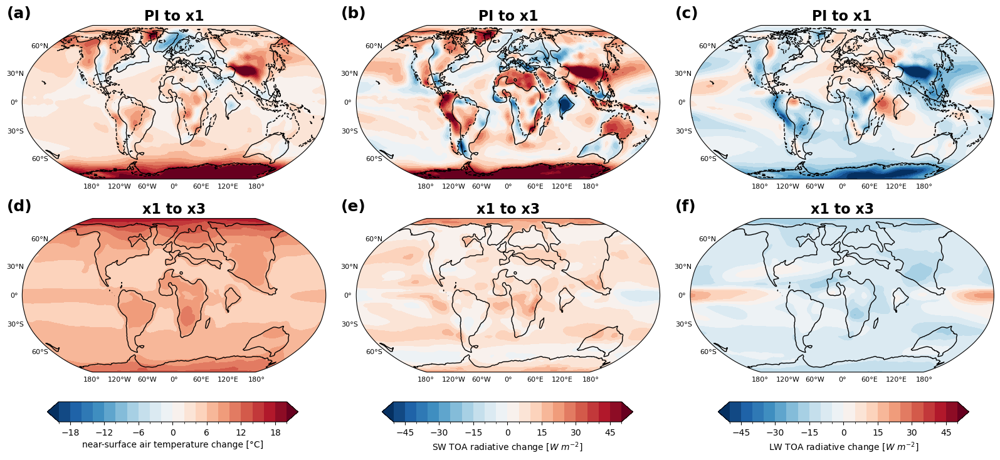

In [16]:
# plot ensemble mean maps of temperature change

# Preparing plots with consistent color scale and projection
variables = ['tas1', 'tas2']  # variables to plot
exp_labels = ['PI to x1', 'x1 to x3']

fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(20, 8), subplot_kw={'projection': ccrs.Robinson(central_longitude=0)})
fig.subplots_adjust(hspace=0.0, wspace=0.1)

# Custom levels for the colorbar
levels = np.arange(-20,22,2)
levels_sw = np.arange(-50,55,5)

# Create a custom colormap with white around zero
custom_cmap =  custom_colormap('RdBu_r')
# load Herold land-sea mask
f_lsm_eocene = xr.open_dataset("/Users/wb19586/Documents/coding_github/aprp_deepmip/data/herold_etal_eocene_topo_1x1.halo.nc")

for row, key in enumerate(sorted(ensemble_means.keys())):
    tas1 = ensemble_means[key]['tas1']
    tas2 = ensemble_means[key]['tas2']
    print(f"{key} global mean: {area_weighted_global_mean(tas2-tas1)}")
    # plot filled contours
    im_temp = global_hatched_map(axs[row, 0], tas2-tas1 , None, f_lsm_eocene.topo, 'modern' if row == 0 else 'eocene', levels=levels, cmap='RdBu_r', title=f'{exp_labels[row]}', gl_labels=True, fontsize=16)
    im_sw = global_hatched_map(axs[row, 1], ensemble_means[key]['net'] , None, f_lsm_eocene.topo, 'modern' if row == 0 else 'eocene', levels=levels_sw, cmap='RdBu_r', title=f'{exp_labels[row]}', gl_labels=True, fontsize=16)
    im_lw = global_hatched_map(axs[row, 2], ensemble_means[key]['lw_net_toa'] * -1.0 , None, f_lsm_eocene.topo, 'modern' if row == 0 else 'eocene', levels=levels_sw, cmap='RdBu_r', title=f'{exp_labels[row]}', gl_labels=True, fontsize=16)

# Create a single colorbar using the last 'im' instance
common_colorbar(fig, im_temp, levels, 'near-surface air temperature change [°C]', False, height = 0.04, width=0.2, x=0.145)
common_colorbar(fig, im_sw, levels_sw, 'SW TOA radiative change [$W\ m^{-2}$]', False, height = 0.04, width=0.2, x=0.412)
common_colorbar(fig, im_lw, levels_sw, 'LW TOA radiative change [$W\ m^{-2}$]', False, height = 0.04, width=0.2, x=0.68)

add_panel_labels(axs.flatten(), fontsize=18, fontweight='bold')

fig.savefig(figure_dir + '/maps_tas_and_TOA_radiation_change.pdf', dpi=200, bbox_inches='tight')

plt.show()


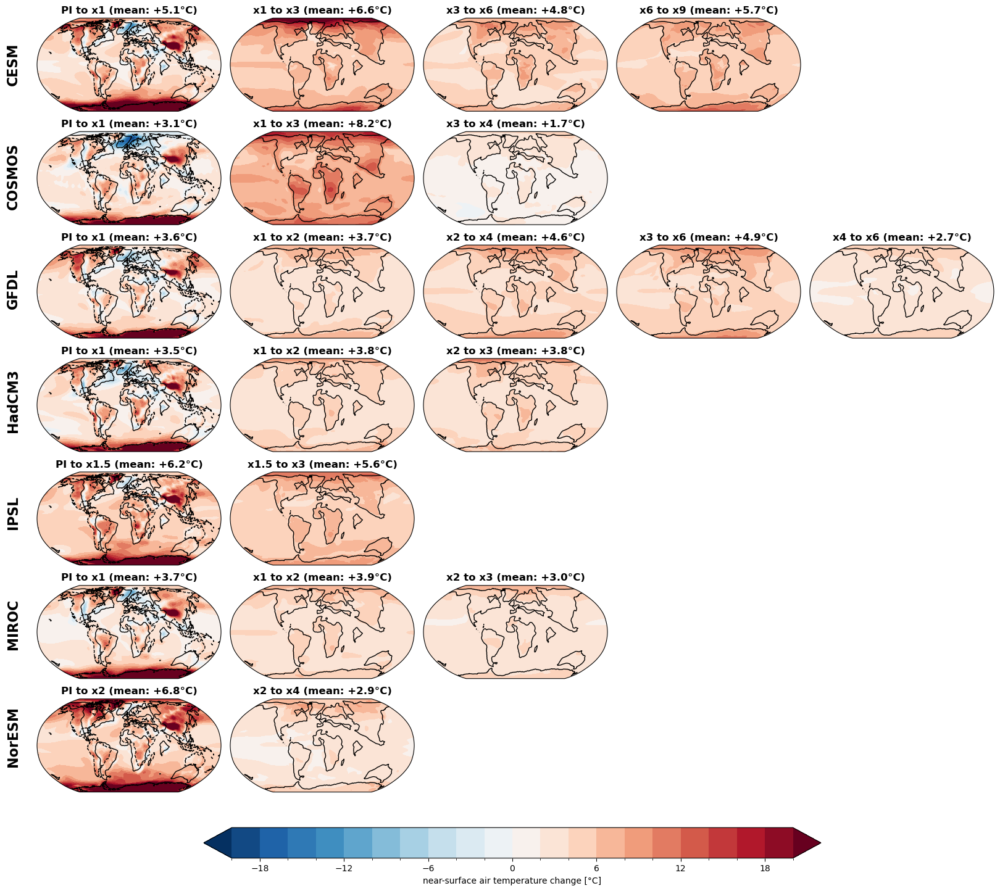

In [27]:
# plot tas changes for all APRP pairs for SI

columns = ["PI","x1", "x1.5", "x2", "x3", "x4", "x6", "x9"]

fig, axs = plt.subplots(nrows=7, ncols=5, figsize=(20, 16.5), subplot_kw={'projection': ccrs.Robinson(central_longitude=0)})
fig.subplots_adjust(hspace=0.1, wspace=0.05)

# Custom levels for the colorbar
levels = np.arange(-20,22,2)
# levels = np.arange(-12,14,2)

# Create a custom colormap with white around zero
custom_cmap =  custom_colormap('RdBu_r')
# load Herold land-sea mask
f_lsm_eocene = xr.open_dataset("/Users/wb19586/Documents/coding_github/aprp_deepmip/data/herold_etal_eocene_topo_1x1.halo.nc")

def get_matching_index(columns, exp):
    """
    Find the index of the column in the list that matches the last two digits of the sensi string.

    """
    # Extract the last two digits from sensi
    last_two_digits = exp[-2:]

    # Find the index of the matching entry in columns
    match_index = -1
    for i, col in enumerate(columns):
        if col.endswith(last_two_digits):
            match_index = i
            break

    return match_index

row = 0
for model, details in deepmip_dict.items():
    num_experiments = details['ncase'] - details['nsens']
    col = 0
    for i in range(5):
        if i < num_experiments:
            contr = details['contr'][i]
            sensi = details['sensi'][i]

            sens_index = get_matching_index(columns, sensi)
            contr_index = get_matching_index(columns, contr)

            # Build file path
            aprp_file = f'{model}.{contr}.to.{sensi}.aprp.r180x90.nc'
            aprp_path = f'{data_dir}/deepmip/remapped/{aprp_file}'

            # Load dataset
            aprp_data_mm = xr.open_dataset(aprp_path, decode_times=False)
            aprp_data_mm = aprp_data_mm.where(aprp_data_mm <= 1e6, np.nan)  # Filter out bad values
            aprp_data    = aprp_data_mm.mean('time')

            # Calculate GMST change for normalised feedback strengths
            coslat     = np.cos(np.deg2rad(aprp_data.lat))
            
            gmst1     = aprp_data['tas1'].weighted(coslat).mean(('lat','lon')) - 273.15
            gmst2     = aprp_data['tas2'].weighted(coslat).mean(('lat','lon')) - 273.15
            dT        = (gmst2 - gmst1).values

            ax = axs[row, i]
            im = global_hatched_map(ax, aprp_data['tas2']-aprp_data['tas1'] , None, f_lsm_eocene.topo, 'modern' if contr == 'deepmip-eocene-p1-PI' else 'eocene', levels=levels, cmap='RdBu_r', title=f'{columns[contr_index]} to {columns[sens_index]} (mean: +{gmst2 - gmst1:.1f}°C)', gl_labels=False)

            col += 1
        else:
            axs[row, i].set_visible(False)

    fig.text(0.1, 0.83 - row * 0.11, details['group'], va='center', ha='left', fontsize=16, fontweight='bold', rotation='vertical')
    row += 1


# # Create a single colorbar using the last 'im' instance
common_colorbar(fig, im, levels, 'near-surface air temperature change [°C]', False, height = 0.03, width=0.5, x=0.26)

# # Add panel labels
# add_panel_labels(axs, fontsize=12, fontweight='bold')

fig.savefig(figure_dir + '/maps_tas_change_all_models_steps_SI.png', dpi=200, bbox_inches='tight')

plt.show()          


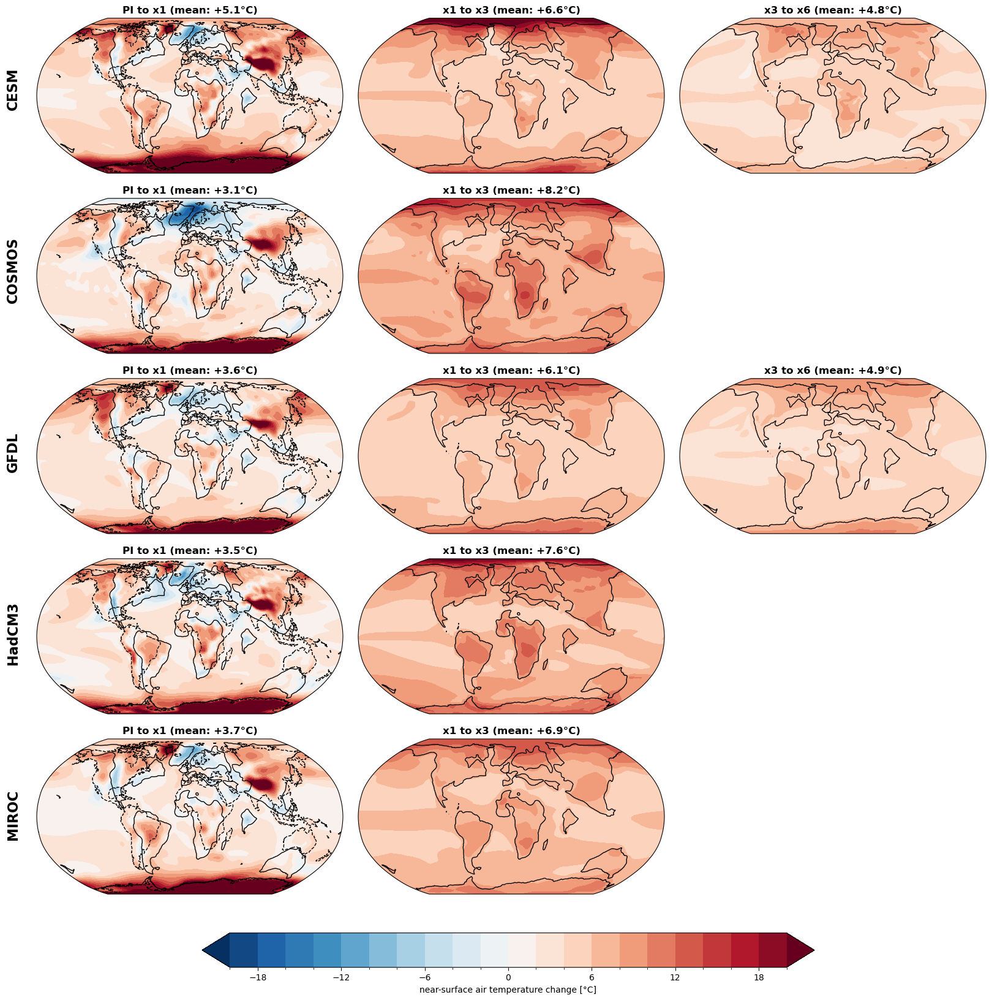

In [36]:
# plot tas changes for all APRP pairs for SI

columns = ["PI","x1", "x1.5", "x2", "x3", "x4", "x6", "x9"]

fig, axs = plt.subplots(nrows=5, ncols=3, figsize=(20, 18.75), subplot_kw={'projection': ccrs.Robinson(central_longitude=0)})
fig.subplots_adjust(hspace=0.1, wspace=0.05)

# Custom levels for the colorbar
levels = np.arange(-20,22,2)
# levels = np.arange(-12,14,2)

# Create a custom colormap with white around zero
custom_cmap =  custom_colormap('RdBu_r')
# load Herold land-sea mask
f_lsm_eocene = xr.open_dataset("/Users/wb19586/Documents/coding_github/aprp_deepmip/data/herold_etal_eocene_topo_1x1.halo.nc")

row = 0
for model, details in deepmip_dict.items():
    num_experiments = details['ncase']
    for i in range(num_experiments):
        contr = details['contr'][i]
        sensi = details['sensi'][i]

        # Define the selected experiments
        if (contr == 'deepmip-eocene-p1-PI' and sensi == 'deepmip-eocene-p1-x1'):
            col = 0
            title = 'PI to x1'
        elif (contr == 'deepmip-eocene-p1-x1' and sensi == 'deepmip-eocene-p1-x3'):
            col = 1
            title = 'x1 to x3'
        elif (contr == 'deepmip-eocene-p1-x3' and sensi == 'deepmip-eocene-p1-x6'):
            col = 2
            title = 'x3 to x6'
        else:
            continue

        # Build file path
        aprp_file = f'{model}.{contr}.to.{sensi}.aprp.r180x90.nc'
        aprp_path = f'{data_dir}/deepmip/remapped/{aprp_file}'

        # Load dataset
        aprp_data_mm = xr.open_dataset(aprp_path, decode_times=False)
        aprp_data_mm = aprp_data_mm.where(aprp_data_mm <= 1e6, np.nan)  # Filter out bad values
        aprp_data    = aprp_data_mm.mean('time')

        # Calculate GMST change for normalised feedback strengths
        coslat     = np.cos(np.deg2rad(aprp_data.lat))
        
        gmst1     = aprp_data['tas1'].weighted(coslat).mean(('lat','lon')) - 273.15
        gmst2     = aprp_data['tas2'].weighted(coslat).mean(('lat','lon')) - 273.15
        dT        = (gmst2 - gmst1).values

        ax = axs[row, col]
        im = global_hatched_map(ax, aprp_data['tas2']-aprp_data['tas1'] , None, f_lsm_eocene.topo, 'modern' if contr == 'deepmip-eocene-p1-PI' else 'eocene', levels=levels, cmap='RdBu_r', title=f'{title} (mean: +{gmst2 - gmst1:.1f}°C)', gl_labels=False)


    if details['group'] in ['CESM', 'COSMOS', 'GFDL', 'HadCM3', 'MIROC', 'MPI']:
        fig.text(0.1, 0.815 - row * 0.158, details['group'], va='center', ha='left', fontsize=16, fontweight='bold', rotation='vertical')
        row += 1

    axs[1, 2].set_visible(False)
    axs[3, 2].set_visible(False)
    axs[4, 2].set_visible(False)


# # Create a single colorbar using the last 'im' instance
common_colorbar(fig, im, levels, 'near-surface air temperature change [°C]', False, height = 0.03, width=0.5, x=0.26)

# # Add panel labels
# add_panel_labels(axs, fontsize=12, fontweight='bold')

fig.savefig(figure_dir + '/maps_tas_change_selected_models.png', dpi=200, bbox_inches='tight')

plt.show()          


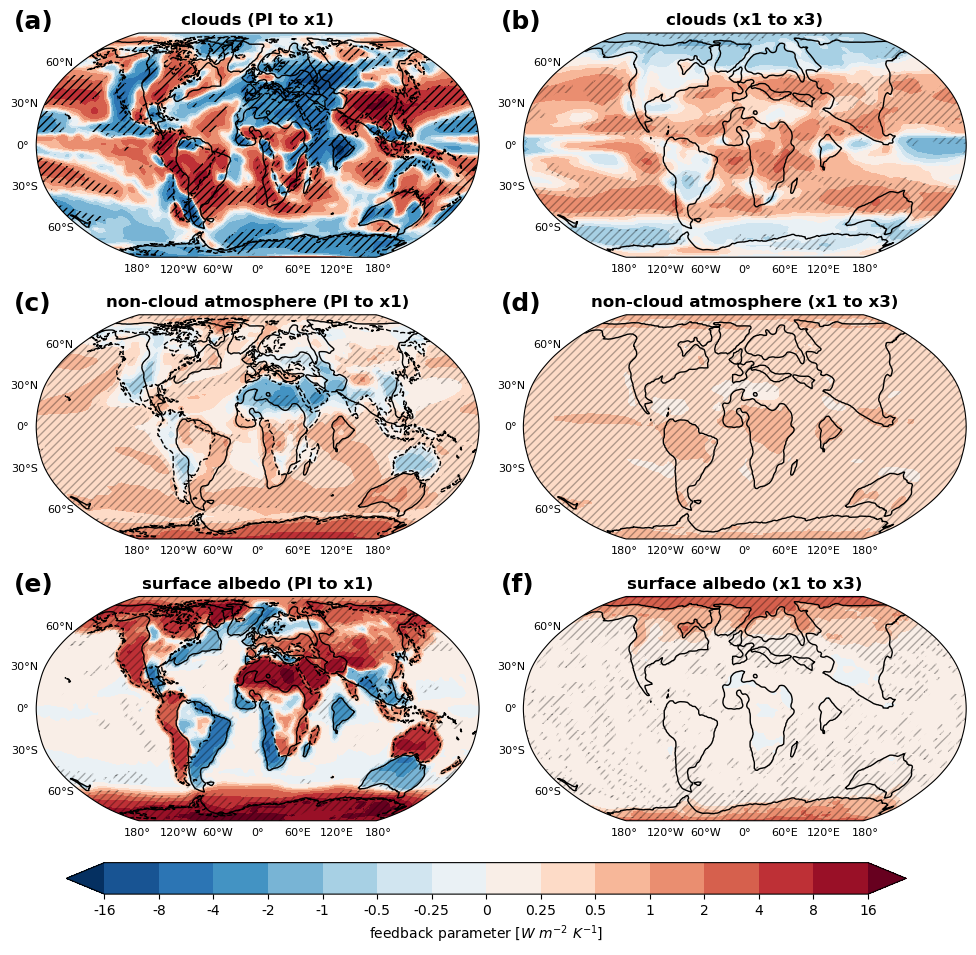

In [3]:
# plot ensemble mean maps

# Preparing plots with consistent color scale and projection
# variables = ['net','cld', 'clr', 'alf']  # variables to plot
# labels = ['net shortwave', 'clouds', 'clear sky', 'surface albedo']
variables = ['cld', 'clr', 'alf']  # variables to plot
labels = ['clouds', 'non-cloud atmosphere', 'surface albedo']
exp_labels = ['PI to x1', 'x1 to x3']

fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(12, 10.5), subplot_kw={'projection': ccrs.Robinson(central_longitude=0)})
fig.subplots_adjust(hspace=0.15, wspace=0.1)

# Custom non-linear levels for the colorbar
# levels = [-50, -25, -10, -5, -2.5,-1, 0, 1, 2.5, 5, 10, 25, 50]
# levels = np.arange(-10,12,2)
levels = [-16, -8, -4 ,-2, -1, -0.5, -0.25, 0, 0.25, 0.5, 1, 2, 4, 8, 16]


# Create a custom colormap with white around zero
custom_cmap =  custom_colormap('RdBu_r')

# load Herold land-sea mask
f_lsm_eocene = xr.open_dataset("/Users/wb19586/Documents/coding_github/aprp_deepmip/data/herold_etal_eocene_topo_1x1.halo.nc")

for col, key in enumerate(sorted(ensemble_means.keys())):
    for row, var in enumerate(variables):
        ax = axs[row, col]
        data_ym = ensemble_means[key][var]
        sign_agreement = ensemble_agreement[key][var]
        # plot filled contours
        im = global_hatched_map(ax, data_ym, sign_agreement, f_lsm_eocene.topo, 'modern' if col == 0 else 'eocene', levels=levels, cmap='RdBu_r', title=f'{labels[row]} ({exp_labels[col]})')

# Create a single colorbar using the last 'im' instance
# common_colorbar(fig, im, levels, 'radiative response [$W\ m^{-2}$]')
common_colorbar(fig, im, levels, 'feedback parameter [$W\ m^{-2}\ K^{-1}$]')

add_panel_labels(axs.flatten(), fontsize=18, fontweight='bold', y_offset=1.02)

fig.savefig(figure_dir + '/maps_main_components.png', dpi=200, bbox_inches='tight')

plt.show()


### individual APRP components

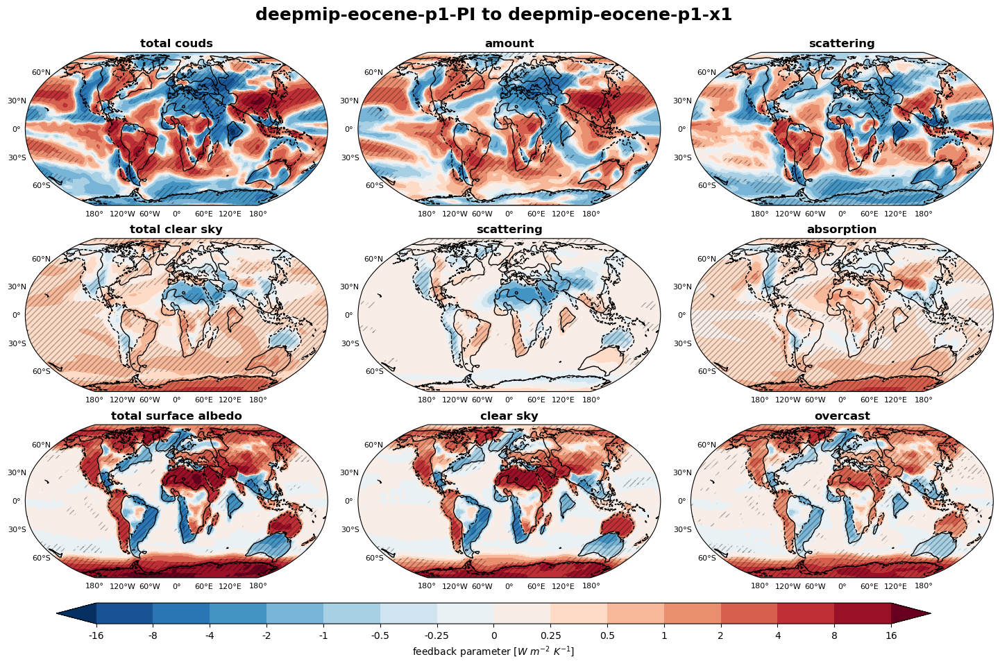

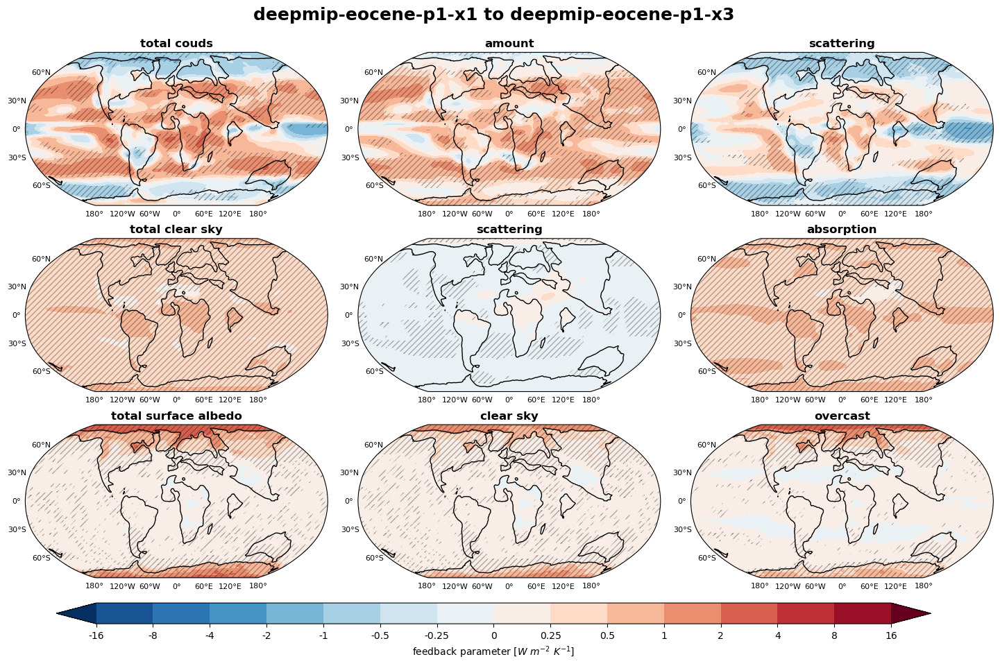

In [154]:
# plot ensemble mean maps of sub components split by experiment pair

# Preparing plots with consistent color scale and projection
variables = ['cld','cld_c', 'cld_od', 'clr', 'clr_ga', 'clr_mu', 'alf', 'alf_clr', 'alf_oc']  # variables to plot
labels = ['total couds','amount', 'scattering', 'total clear sky', 'scattering', 'absorption', 'total surface albedo', 'clear sky', 'overcast']  # variables to plot
exp_keys = [f"deepmip-eocene-p1-PI to deepmip-eocene-p1-x1", "deepmip-eocene-p1-x1 to deepmip-eocene-p1-x3"]

# Custom non-linear levels for the colorbar
# levels = [-50, -25, -10, -5, -2.5,-1, 0, 1, 2.5, 5, 10, 25, 50]
levels = [-16, -8, -4 ,-2, -1, -0.5, -0.25, 0, 0.25, 0.5, 1, 2, 4, 8, 16]

# Create a custom colormap with white around zero
# custom_cmap =  custom_colormap('RdBu_r')

# load Herold land-sea mask
f_lsm_eocene = xr.open_dataset("/Users/wb19586/Documents/coding_github/aprp_deepmip/data/herold_etal_eocene_topo_1x1.halo.nc")

for key in exp_keys:
    fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(18, 10), subplot_kw={'projection': ccrs.Robinson(central_longitude=0)})
    fig.subplots_adjust(hspace=0.15, wspace=0.1)
    col = 0
    row = 0
    for idx, var in enumerate(variables):
        ax = axs[row, col]
        data_ym = ensemble_means[key][var]
        sign_agreement = ensemble_agreement[key][var]
        # plot filled contours
        if key == 'deepmip-eocene-p1-PI to deepmip-eocene-p1-x1':
            time = 'modern'
        elif key == 'deepmip-eocene-p1-x1 to deepmip-eocene-p1-x3':
            time = 'eocene'
        im = global_hatched_map(ax, data_ym, sign_agreement, f_lsm_eocene.topo, time, levels=levels, cmap="RdBu_r", title=f'{labels[idx]}')
        col += 1
        if col == 3:
            col = 0
            row += 1
    # Create a single colorbar using the last 'im' instance
    # common_colorbar(fig, im, levels, 'radiative response [$W\ m^{-2}$]')
    common_colorbar(fig, im, levels, 'feedback parameter [$W\ m^{-2}\ K^{-1}$]')

    plt.suptitle(f'{key}', fontsize=18, fontweight='bold', y=0.94)
    fig.savefig(f'{figure_dir}/maps_sub_components-{key}.png', dpi=200, bbox_inches='tight')

    plt.show()

### changes in individual models

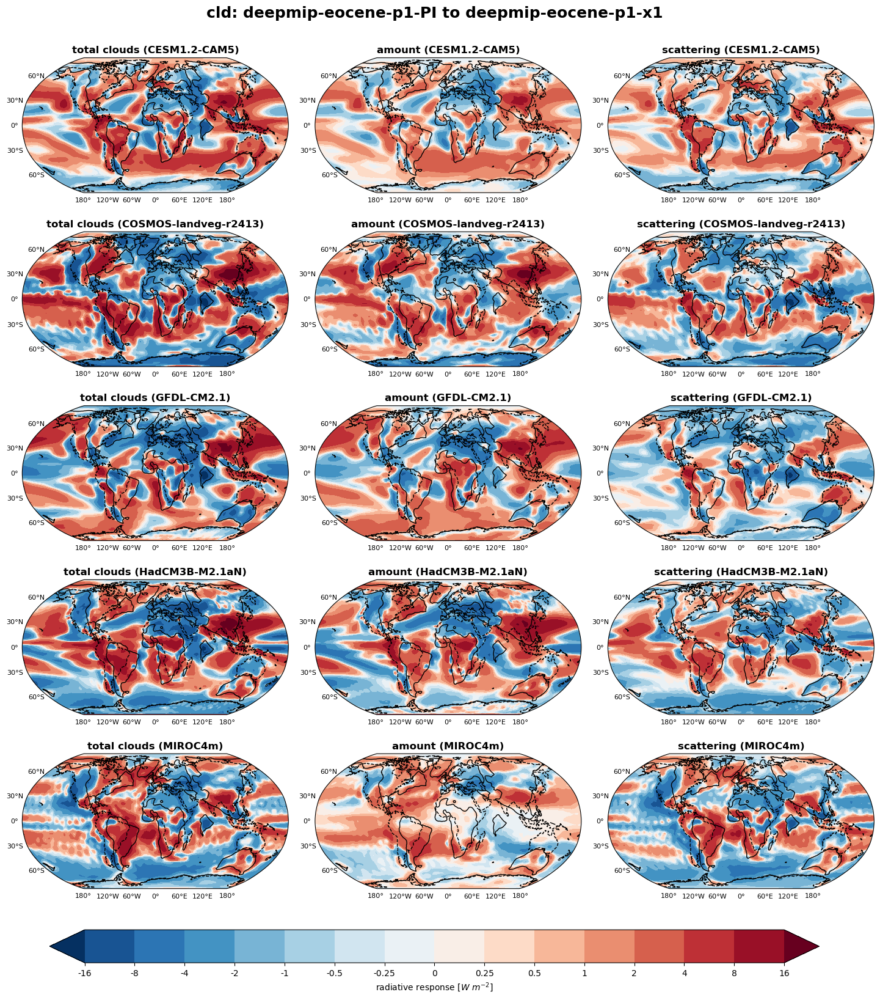

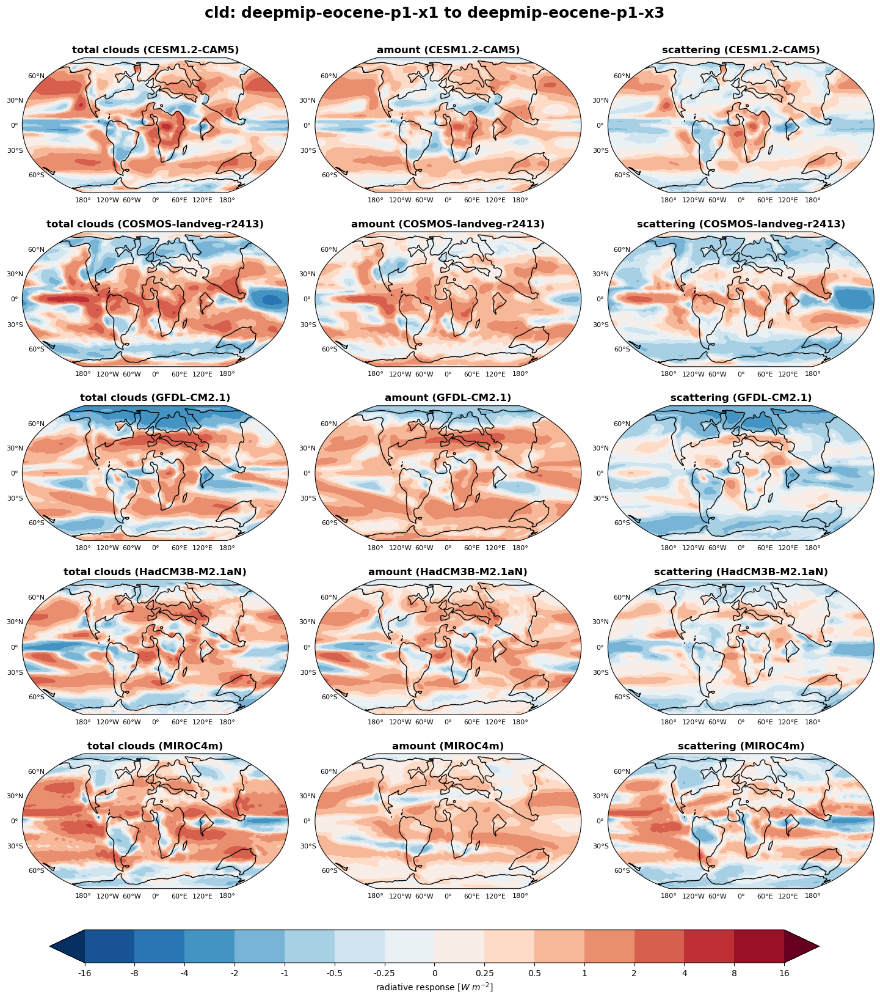

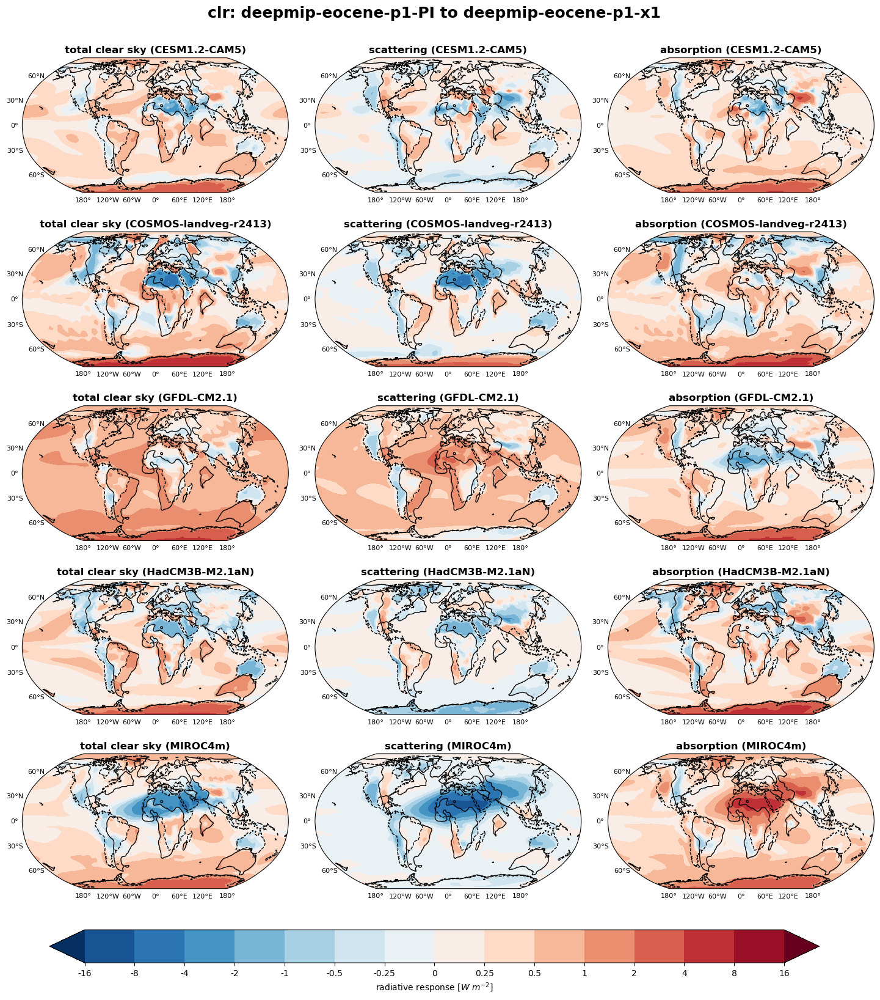

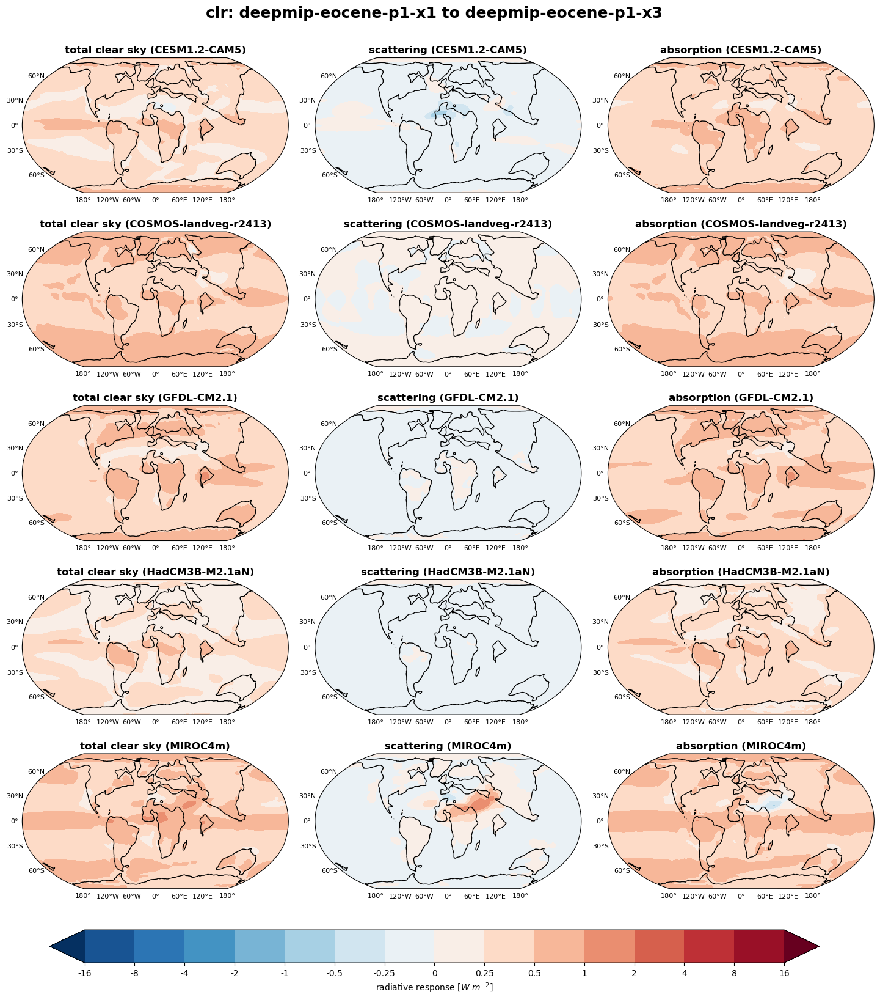

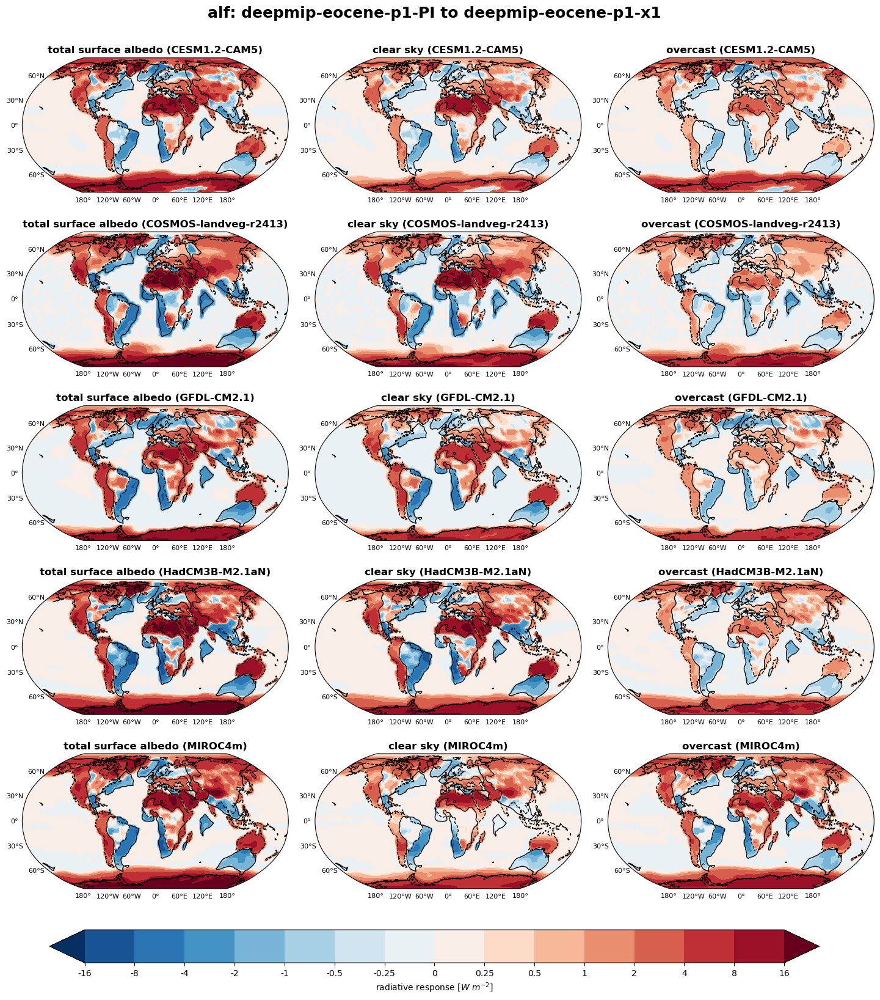

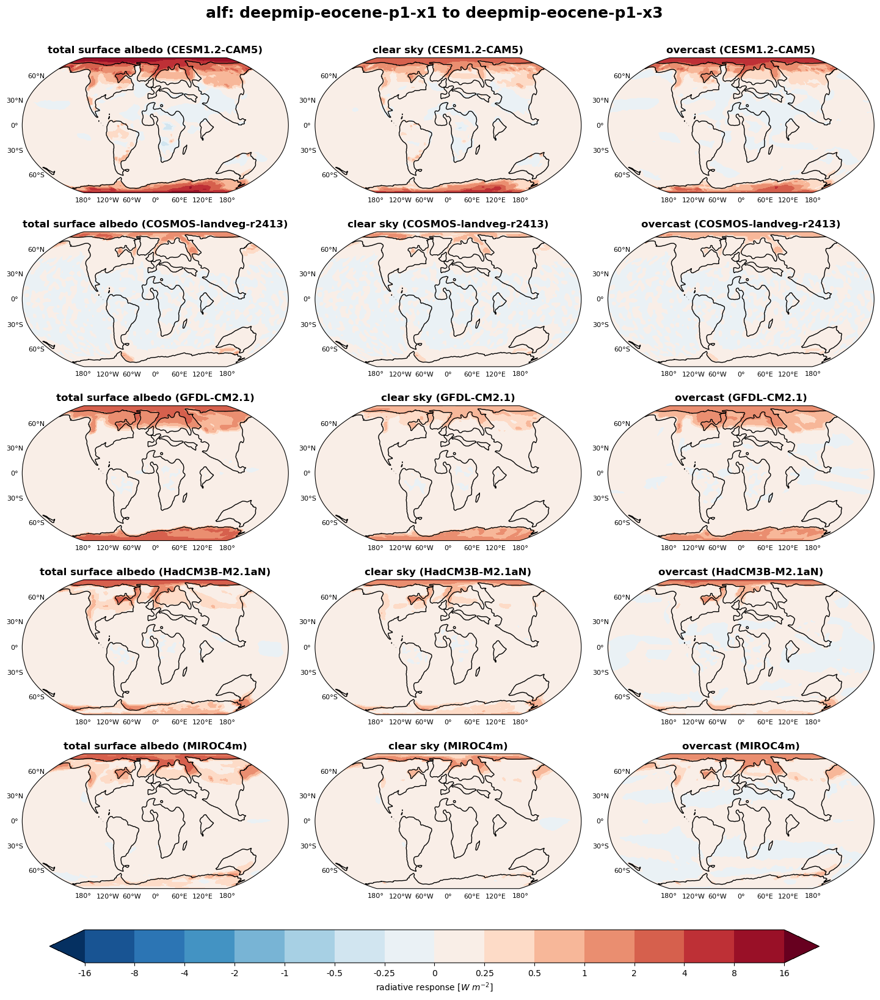

In [157]:
exp_keys = [f"deepmip-eocene-p1-PI to deepmip-eocene-p1-x1", "deepmip-eocene-p1-x1 to deepmip-eocene-p1-x3"]
component_keys = ['cld', 'clr', 'alf']
# Custom non-linear levels for the colorbar
# levels = [-50, -25, -10, -5, -2.5,-1, 0, 1, 2.5, 5, 10, 25, 50]
levels = [-16, -8, -4 ,-2, -1, -0.5, -0.25, 0, 0.25, 0.5, 1, 2, 4, 8, 16]

# Create a custom colormap with white around zero
# custom_cmap =  custom_colormap('RdBu_r')

# load Herold land-sea mask
f_lsm_eocene = xr.open_dataset("/Users/wb19586/Documents/coding_github/aprp_deepmip/data/herold_etal_eocene_topo_1x1.halo.nc")

for component in component_keys:
    for key in exp_keys:
        fig, axs = plt.subplots(nrows=5, ncols=3, figsize=(18, 18), subplot_kw={'projection': ccrs.Robinson(central_longitude=0)})
        fig.subplots_adjust(hspace=0.15, wspace=0.1)
        row = 0
        col = 0
        for model, details in deepmip_dict.items():
            num_experiments = details['ncase']
            for i in range(num_experiments-1):
                contr = details['contr'][i]
                sensi = details['sensi'][i]

                # Define the conditions for ensemble averaging
                if (f'{contr} to {sensi}' == key):

                    # Build file path
                    aprp_file = f'{model}.{contr}.to.{sensi}.aprp.r180x90.nc'
                    aprp_path = f'{data_dir}/deepmip/remapped/{aprp_file}'

                    # Load dataset
                    aprp_data_mm = xr.open_dataset(aprp_path, decode_times=False)
                    aprp_data_mm = aprp_data_mm.where(aprp_data_mm <= 1e6, np.nan)  # Filter out bad values
                    aprp_data    = aprp_data_mm.mean('time')

                    # Calculate GMST change for normalised feedback strengths
                    coslat     = np.cos(np.deg2rad(aprp_data.lat))
                    
                    gmst1     = aprp_data['tas1'].weighted(coslat).mean(('lat','lon')) - 273.15
                    gmst2     = aprp_data['tas2'].weighted(coslat).mean(('lat','lon')) - 273.15
                    dT        = (gmst2 - gmst1).values

                    # Normalize all fields by dT
                    aprp_data = aprp_data / dT
                    
                    if component == 'cld':
                        var_keys = ['cld', 'cld_c', 'cld_ga']
                        # combine scattering and absorption
                        aprp_data['cld_ga'] = aprp_data['cld_ga'] + aprp_data['cld_mu']
                        labels = ['total clouds', 'amount', 'scattering']
                    elif component == 'clr':
                        var_keys = ['clr', 'clr_ga', 'clr_mu']
                        labels = ['total clear sky', 'scattering', 'absorption']
                    elif component == 'alf':
                        var_keys = ['alf', 'alf_clr', 'alf_oc']
                        labels = ['total surface albedo', 'clear sky', 'overcast']

                    for idx,var in enumerate(var_keys):
                        ax = axs[row, col]
                        # plot filled contours
                        if key == 'deepmip-eocene-p1-PI to deepmip-eocene-p1-x1':
                            time = 'modern'
                        elif key == 'deepmip-eocene-p1-x1 to deepmip-eocene-p1-x3':
                            time = 'eocene'
                        im = global_hatched_map(ax, aprp_data[var], None, f_lsm_eocene.topo, time, levels=levels, cmap='RdBu_r', title=f'{labels[idx]} ({model})')
                        col += 1
                        if col == 3:
                            col = 0
                            row += 1
        # Create a single colorbar using the last 'im' instance
        # common_colorbar(fig, im, levels, 'radiative response [$W\ m^{-2}$]')
        common_colorbar(fig, im, levels, 'feedback parameter [$W\ m^{-2}\ K^{-1}$]')

        plt.suptitle(f'{component}: {key}', fontsize=18, fontweight='bold', y=0.92)

        fig.savefig(f'{figure_dir}/maps_{component}_individual_models_{key}.png', dpi=200, bbox_inches='tight')

        plt.show()

### relate clear-sky absorption changes to changes in water vapour
can use specific humidity from DeepMIP models to calculate "total precipitable water"; 
>"Precipitable water is the depth of water in a column of the atmosphere, if all the water in that column were precipitated as rain. As a depth, the precipitable water is measured in millimeters or inches. Often abbreviated as "TPW", for Total Precipitable Water."

$TPW = \int \frac{q(p) \, dp}{g}$
​	
 


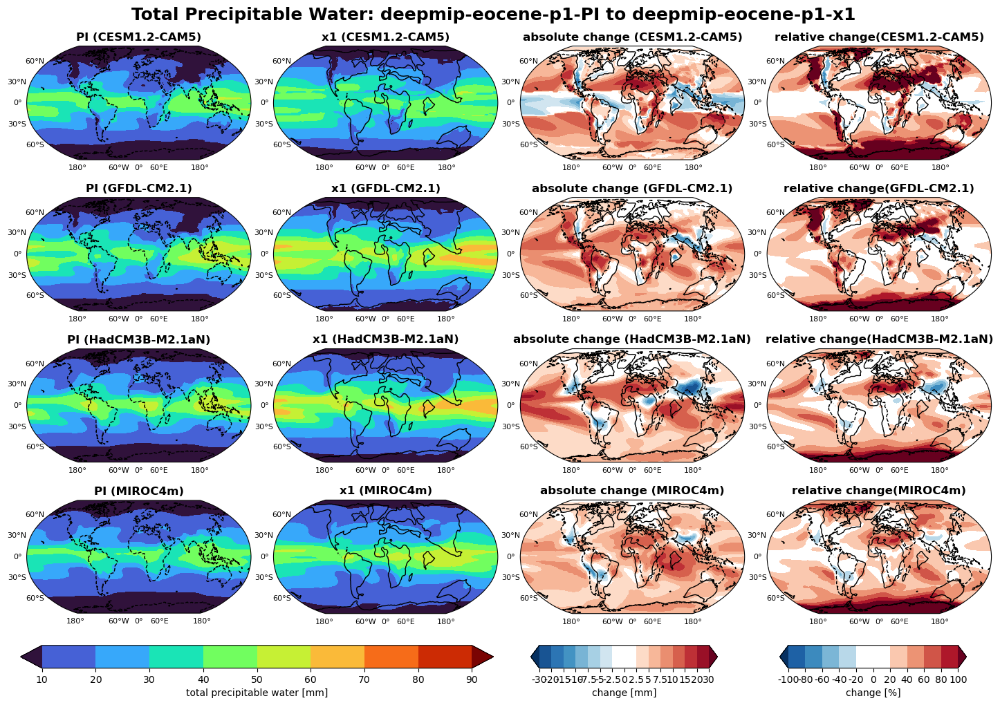

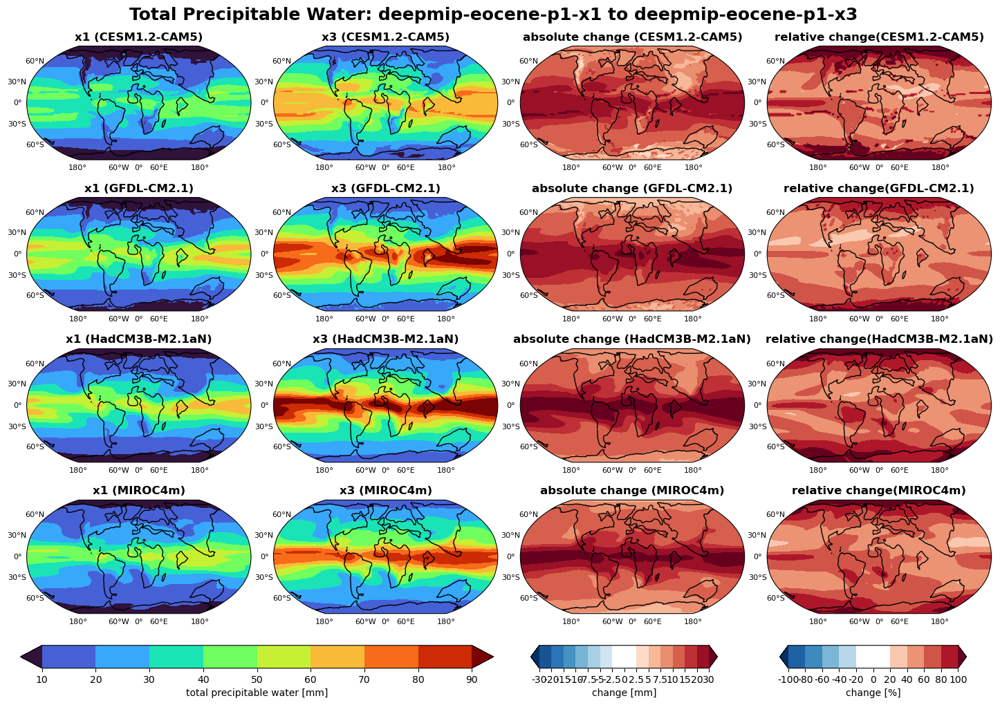

In [152]:
importlib.reload(helper)
from helper import *


exp_keys = [f"deepmip-eocene-p1-PI to deepmip-eocene-p1-x1", "deepmip-eocene-p1-x1 to deepmip-eocene-p1-x3"]

# Custom non-linear levels for the colorbar
mean_levels = np.arange(10,100,10)
diff_levels = [-30,-20, -15, -10, -7.5, -5, -2.5, 0, 2.5, 5, 7.5, 10, 15, 20,30]
# diff_levels = np.arange(-24,28,4)
diff_levels_percent = np.arange(-100,120,20)

# Create a custom colormap with white around zero
custom_cmap =  custom_colormap('RdBu_r')

# load Herold land-sea mask
f_lsm_eocene = xr.open_dataset("/Users/wb19586/Documents/coding_github/aprp_deepmip/data/herold_etal_eocene_topo_1x1.halo.nc")

for key in exp_keys:
    fig, axs = plt.subplots(nrows=4, ncols=4, figsize=(18, 11), subplot_kw={'projection': ccrs.Robinson(central_longitude=0)})
    fig.subplots_adjust(hspace=0.15, wspace=0.1)
    row = 0
    for model, details in deepmip_dict.items():
        num_experiments = details['ncase'] + details['nsens']
        for i in range(num_experiments-1):
            contr = details['contr'][i]
            sensi = details['sensi'][i]

            # Define the conditions for ensemble averaging
            if (f'{contr} to {sensi}' == key):

                if contr == 'deepmip-eocene-p1-PI':
                    label_1 = 'PI'
                    label_2 = 'x1'
                elif contr == 'deepmip-eocene-p1-x1':
                    label_1 = 'x1'
                    label_2 = 'x3'

                # Build file path to specific humidity ('hus')
                hus_path = f'{deepmip_dir}/{deepmip_dict[model]["group"]}/{model}/'
                hus_file_ctrl = f'{hus_path}/{contr}/v1.0/climatology/hus_{model}_{contr}_v1.0.mean.nc'
                hus_file_sens = f'{hus_path}/{sensi}/v1.0/climatology/hus_{model}_{sensi}_v1.0.mean.nc'

                # Load dataset
                hus_data_ctrl_mm = xr.open_dataset(hus_file_ctrl, decode_times=False)
                hus_data_sens_mm = xr.open_dataset(hus_file_sens, decode_times=False)

                vert_variable = find_varname_from_attribute(hus_data_ctrl_mm, 'axis', 'Z')
                time_variable = find_varname_from_attribute(hus_data_ctrl_mm, 'axis', 'T')

                # aprp_data_mm = aprp_data_mm.where(aprp_data_mm <= 1e6, np.nan)  # Filter out bad values
                hus_data_ctrl    = hus_data_ctrl_mm.mean(time_variable)
                hus_data_sens    = hus_data_sens_mm.mean(time_variable)

                tpw_ctrl = add_cyclic_data(calc_tpw(hus_data_ctrl))
                tpw_sens = add_cyclic_data(calc_tpw(hus_data_sens))
                tpw_diff = tpw_sens - tpw_ctrl
                tpw_diff_percent = (tpw_diff / tpw_ctrl) * 100

                if ( contr == 'deepmip-eocene-p1-PI' ):
                    time_left = 'modern_only'
                    time_right = 'modern'
                else:
                    time_left = 'eocene'
                    time_right = 'eocene'

                im_left = global_hatched_map(axs[row, 0], tpw_ctrl, None, f_lsm_eocene.topo, time_left, levels=mean_levels, cmap='turbo', title=f'{label_1} ({model})')
                im_middle = global_hatched_map(axs[row, 1], tpw_sens, None, f_lsm_eocene.topo, 'eocene', levels=mean_levels, cmap='turbo', title=f'{label_2} ({model})')
                im_right = global_hatched_map(axs[row, 2], tpw_diff, None, f_lsm_eocene.topo, time_right, levels=diff_levels, cmap=custom_cmap, title=f'absolute change ({model})')
                im_percent = global_hatched_map(axs[row, 3], tpw_diff_percent, None, f_lsm_eocene.topo, time_right, levels=diff_levels_percent, cmap=custom_cmap, title=f'relative change({model})')

                row += 1
    # Create a single colorbar using the last 'im' instance
    common_colorbar(fig, im_left, mean_levels, 'total precipitable water [mm]', x=0.12, width = 0.38)
    common_colorbar(fig, im_right, diff_levels, 'change [mm]', x=0.53, width = 0.15)
    common_colorbar(fig, im_percent, diff_levels_percent, 'change [%]', x=0.73, width = 0.15)

    plt.suptitle(f'Total Precipitable Water: {key}', fontsize=18, fontweight='bold', y=0.92)

    fig.savefig(f'{figure_dir}/maps_TPW_{key}.png', dpi=200, bbox_inches='tight')

    plt.show()

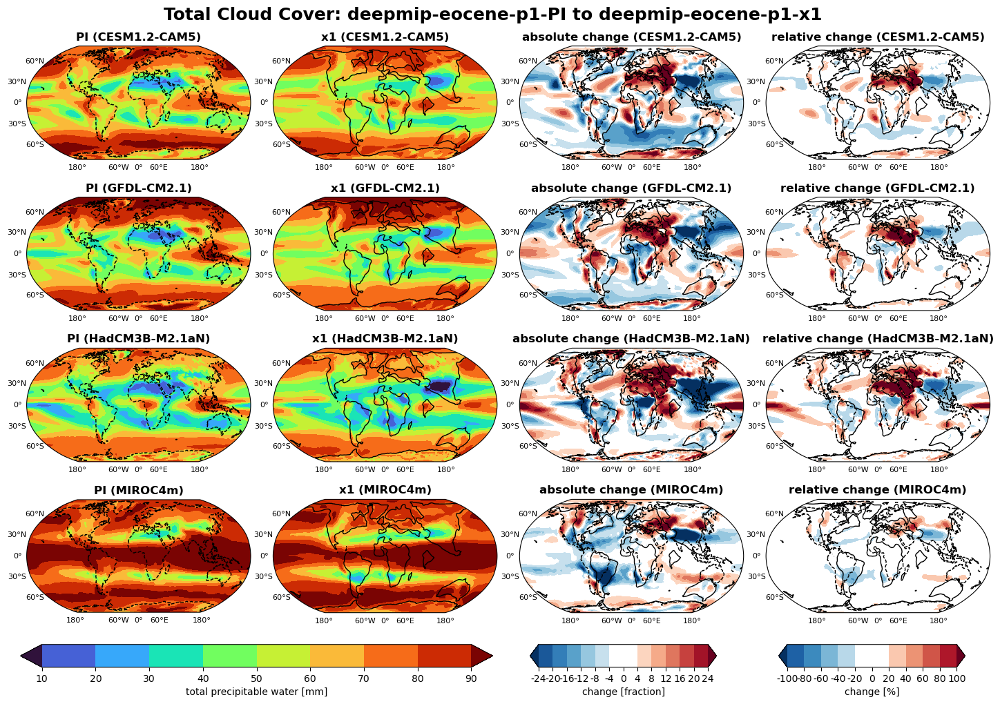

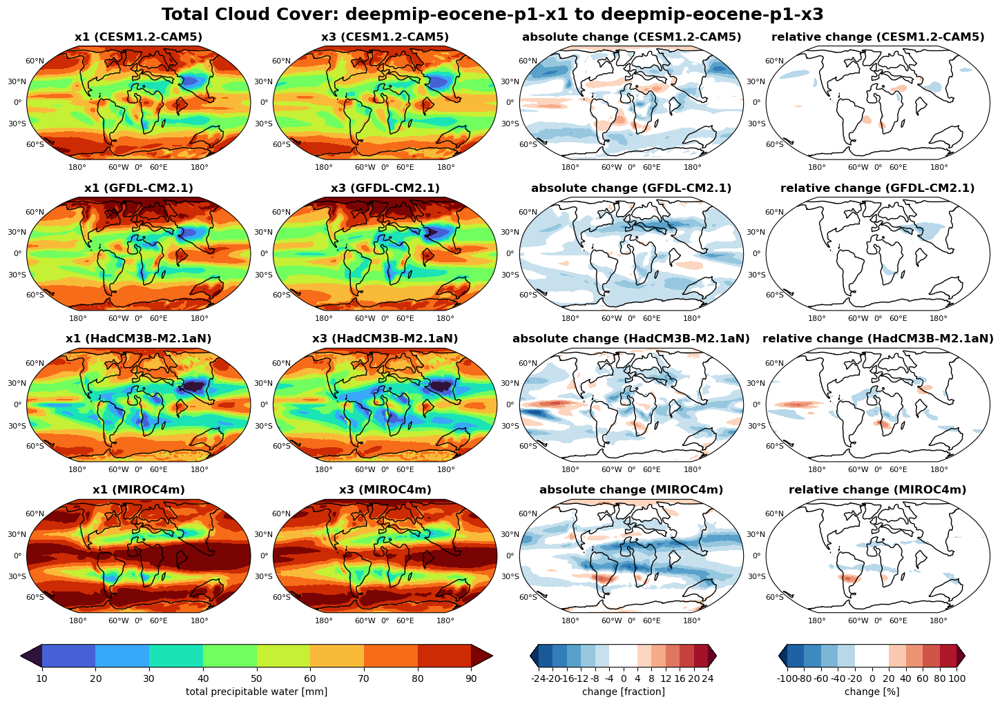

In [148]:
# plot total cloud cover changes

importlib.reload(helper)
from helper import *


exp_keys = [f"deepmip-eocene-p1-PI to deepmip-eocene-p1-x1", "deepmip-eocene-p1-x1 to deepmip-eocene-p1-x3"]

# Custom non-linear levels for the colorbar
mean_levels = np.arange(10,100,10)
diff_levels_percent = np.arange(-100,120,20)

# Create a custom colormap with white around zero
custom_cmap =  custom_colormap('RdBu_r')

# load Herold land-sea mask
f_lsm_eocene = xr.open_dataset("/Users/wb19586/Documents/coding_github/aprp_deepmip/data/herold_etal_eocene_topo_1x1.halo.nc")

for key in exp_keys:
    fig, axs = plt.subplots(nrows=4, ncols=4, figsize=(18, 11), subplot_kw={'projection': ccrs.Robinson(central_longitude=0)})
    fig.subplots_adjust(hspace=0.15, wspace=0.1)
    row = 0
    for model, details in deepmip_dict.items():
        num_experiments = details['ncase'] + details['nsens']
        for i in range(num_experiments-1):
            contr = details['contr'][i]
            sensi = details['sensi'][i]

            # Define the conditions for ensemble averaging
            if (f'{contr} to {sensi}' == key):

                if contr == 'deepmip-eocene-p1-PI':
                    label_1 = 'PI'
                    label_2 = 'x1'
                elif contr == 'deepmip-eocene-p1-x1':
                    label_1 = 'x1'
                    label_2 = 'x3'

                # Build file path to specific humidity ('hus')
                clt_path = f'{deepmip_dir}/{deepmip_dict[model]["group"]}/{model}/'
                clt_file_ctrl = f'{clt_path}/{contr}/v1.0/climatology/clt_{model}_{contr}_v1.0.mean.nc'
                clt_file_sens = f'{clt_path}/{sensi}/v1.0/climatology/clt_{model}_{sensi}_v1.0.mean.nc'

                # Load dataset
                clt_data_ctrl_mm = xr.open_dataset(clt_file_ctrl, decode_times=False)
                clt_data_sens_mm = xr.open_dataset(clt_file_sens, decode_times=False)

                time_variable = find_varname_from_attribute(clt_data_ctrl_mm, 'axis', 'T')

                clt_data_ctrl    = add_cyclic_data(clt_data_ctrl_mm['clt'].mean(time_variable))
                clt_data_sens    = add_cyclic_data(clt_data_sens_mm['clt'].mean(time_variable))

                clt_diff = clt_data_sens - clt_data_ctrl
                clt_diff_percent = (clt_diff / clt_data_ctrl) * 100

                if ( contr == 'deepmip-eocene-p1-PI' ):
                    time_left = 'modern_only'
                    time_right = 'modern'
                else:
                    time_left = 'eocene'
                    time_right = 'eocene'

                im_left = global_hatched_map(axs[row, 0], clt_data_ctrl, None, f_lsm_eocene.topo, time_left, levels=mean_levels, cmap='turbo', title=f'{label_1} ({model})')
                im_middle = global_hatched_map(axs[row, 1], clt_data_sens, None, f_lsm_eocene.topo, 'eocene', levels=mean_levels, cmap='turbo', title=f'{label_2} ({model})')
                im_right = global_hatched_map(axs[row, 2], clt_diff, None, f_lsm_eocene.topo, time_right, levels=diff_levels, cmap=custom_cmap, title=f'absolute change ({model})')
                im_percent = global_hatched_map(axs[row, 3], clt_diff_percent, None, f_lsm_eocene.topo, time_right, levels=diff_levels_percent, cmap=custom_cmap, title=f'relative change ({model})')

                row += 1
    # Create a single colorbar using the last 'im' instance
    common_colorbar(fig, im_left, mean_levels, 'total precipitable water [mm]', x=0.12, width = 0.38)
    common_colorbar(fig, im_right, diff_levels, 'change [fraction]', x=0.53, width = 0.15)
    common_colorbar(fig, im_percent, diff_levels_percent, 'change [%]', x=0.73, width = 0.15)

    plt.suptitle(f'Total Cloud Cover: {key}', fontsize=18, fontweight='bold', y=0.92)

    fig.savefig(f'{figure_dir}/maps_total_cloud_cover_{key}.png', dpi=200, bbox_inches='tight')

    plt.show()